In [146]:
# Import packages

import os
import pandas as pd
import streamlit as st
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
#from nltk.tokenize import word_tokenize
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
import re
import pylab
import pickle





[nltk_data] Downloading package punkt to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Initialize variables
'''tweet_count = 5000
username = 'elonmusk'
since_date = '2022-01-01'

# Using OS library to get tweets from a username since a date
os.system(f'snscrape --jsonl --since {since_date} twitter-search "from:{username}"> musk_tweets_2022.json');
tweets_df = pd.read_json('musk_tweets_2022.json', lines=True)'''

'tweet_count = 5000\nusername = \'elonmusk\'\nsince_date = \'2022-01-01\'\n\n# Using OS library to get tweets from a username since a date\nos.system(f\'snscrape --jsonl --since {since_date} twitter-search "from:{username}"> musk_tweets_2022.json\');\ntweets_df = pd.read_json(\'musk_tweets_2022.json\', lines=True)'

In [3]:
tweets_df = pd.read_csv("data/tweets_clean.csv")
tweets_df.shape


(15438, 16)

In [4]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15438 entries, 0 to 15437
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              15438 non-null  object 
 1   user              15438 non-null  object 
 2   date              15438 non-null  object 
 3   category          15438 non-null  object 
 4   id                15438 non-null  float64
 5   content           15438 non-null  object 
 6   lang              15438 non-null  object 
 7   sourceLabel       15438 non-null  object 
 8   inReplyToTweetId  4579 non-null   float64
 9   inReplyToUser     4579 non-null   object 
 10  mentionedUsers    6317 non-null   object 
 11  hashtags          1438 non-null   object 
 12  replyCount        15438 non-null  float64
 13  retweetCount      15438 non-null  float64
 14  likeCount         15438 non-null  float64
 15  quoteCount        15438 non-null  float64
dtypes: float64(6), object(10)
memory usage: 

In [5]:
tweets_df["name"].unique()

array(['Elon Musk', 'Sundar Pichai', 'Tim Cook', 'Jeff Bezos',
       'Satya Nadella', 'Bill Gates', 'Volodymyr Zelenskyy', 'Joe Biden',
       'Alexandria Ocaso-Cortez', 'Ron DeSantis', 'Barack Obama',
       'Narendra Modi', 'Kim Kardashian', 'Rihanna', 'Justin Bieber',
       'Katy Perry', 'Lady Gaga', 'Ellen Degeneres'], dtype=object)

In [6]:
#df['foo'] = pd.to_numeric(df['foo'], errors='coerce')
#tweets_df.likeCount.mean()



In [78]:
#get the statistic metrics

tweets_df.describe()

,id,inReplyToTweetId,replyCount,retweetCount,likeCount,quoteCount
count,1.543800e+04,4.579000e+03,15438.000000,15438.000000,1.543800e+04,15438.000000
mean,1.542139e+18,1.544552e+18,2750.999417,4450.634214,3.934480e+04,591.716155
std,3.557211e+16,4.474842e+16,8377.355446,13549.268988,1.175424e+05,3371.025454
min,1.477080e+18,2.623659e+17,0.000000,0.000000,4.000000e+00,0.000000
25%,1.511919e+18,1.517688e+18,261.000000,433.250000,5.322250e+03,32.000000
50%,1.539561e+18,1.539366e+18,705.000000,1898.000000,1.262900e+04,87.000000
75%,1.575982e+18,1.581372e+18,2059.000000,4223.750000,3.076400e+04,290.000000
max,1.598037e+18,1.598007e+18,318785.000000,676568.000000,4.749958e+06,179719.000000


In [79]:
celebs= list(tweets_df["name"].unique())
tech1 =[]
tech1.append(celebs[0])
tech2= list(celebs[2:4])
tech3 =tech1 + tech2

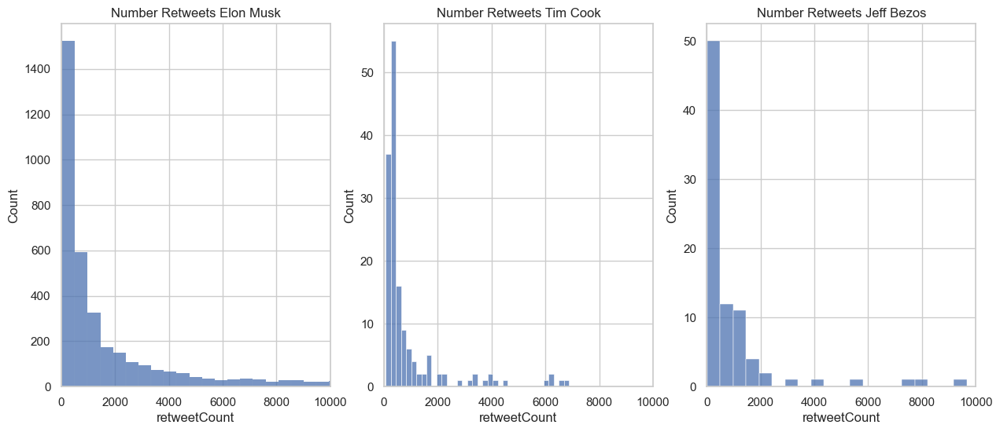

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

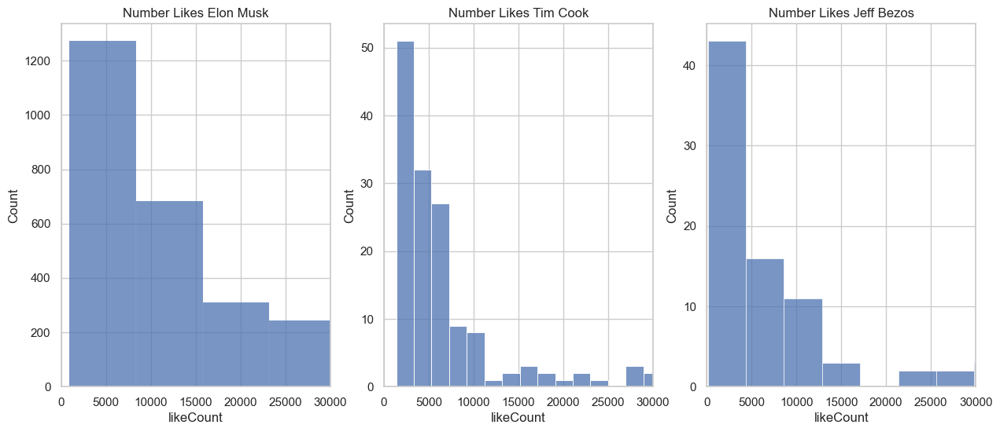

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

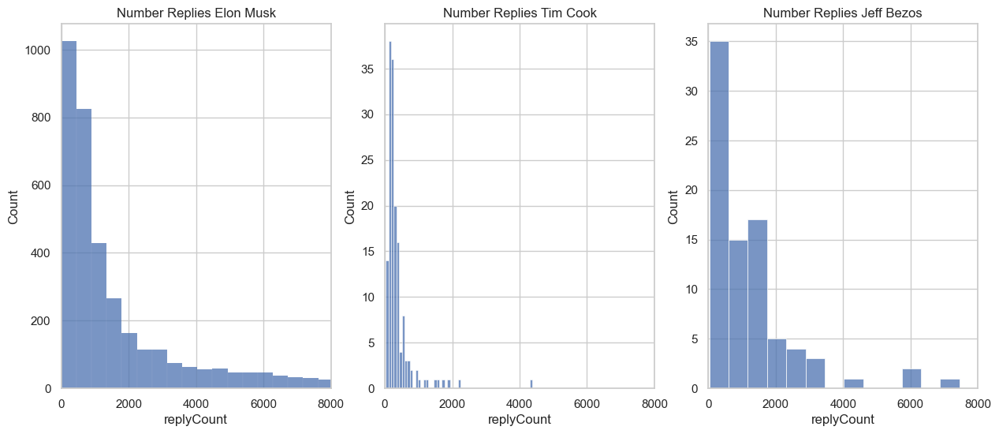

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [80]:

fig, ax = plt.subplots(1, len(tech3), figsize=(15, 6));

for i in range(len(tech3)):
    
    plt.figure()
    sns.histplot(x='retweetCount', data=tweets_df[tweets_df['name'] == tech3[i]], ax=ax[i])
    ax[i].set_title(f"Number Retweets {tech3[i]}")
    ax[i].set_xlim(0, 10000);
    

fig, ax = plt.subplots(1, len(tech3), figsize=(15, 6))

for i in range(len(tech3)): 
    plt.figure()
    sns.histplot(x='likeCount', data=tweets_df[tweets_df['name'] == tech3[i]], ax=ax[i])
    ax[i].set_title(f"Number Likes {tech3[i]}")
    ax[i].set_xlim(0, 30000);

    
fig, ax = plt.subplots(1, len(tech3), figsize=(15, 6))

for i in range(len(tech3)): 
    plt.figure();
    sns.histplot(x='replyCount', data=tweets_df[tweets_df['name'] == tech3[i]], ax=ax[i])
    ax[i].set_title(f"Number Replies {tech3[i]}")
    ax[i].set_xlim(0, 8000);


<AxesSubplot:>

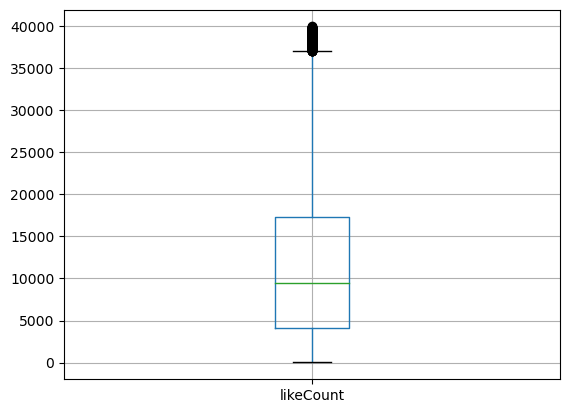

In [11]:
#Boxplot for the Likecount
outlier = tweets_df[tweets_df['likeCount'] < 40000]
outlier.boxplot(column =['likeCount'], grid = True)

<AxesSubplot:>

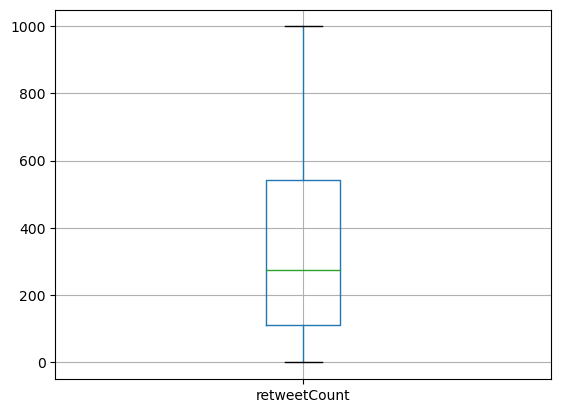

In [12]:
#Boxplot for retweetCount
outlier = tweets_df[tweets_df['retweetCount'] < 1000]
outlier.boxplot(column =['retweetCount'], grid = True)

In [81]:
df_test = tweets_df[["name", "likeCount", ]]
s = df_test.groupby('name').likeCount.sum()
so = s.sort_values(ascending = False)

In [82]:
df_group = df_test.groupby('name').agg({"likeCount": ["nunique", "sum"]})
df_group.columns = df_group.columns.droplevel(0)
df_group.columns = ["number_tweets", "likecount_sum"]
df_group

,number_tweets,likecount_sum
name,,
Alexandria Ocaso-Cortez,520,24761839.0
Barack Obama,347,13250221.0
Bill Gates,344,1006426.0
Ellen Degeneres,649,1216970.0
Elon Musk,3945,337666459.0
Jeff Bezos,88,1448561.0
Joe Biden,2321,75748792.0
Justin Bieber,3,217506.0
Katy Perry,233,2588968.0


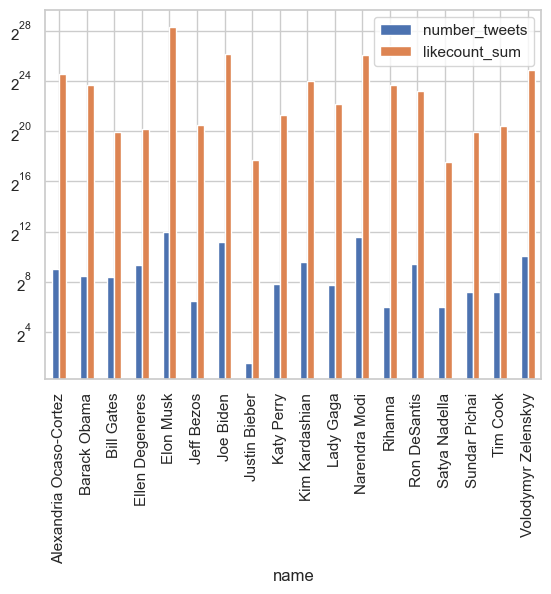

In [96]:
df_group.plot.bar()
plt.yscale('log',base=2) 

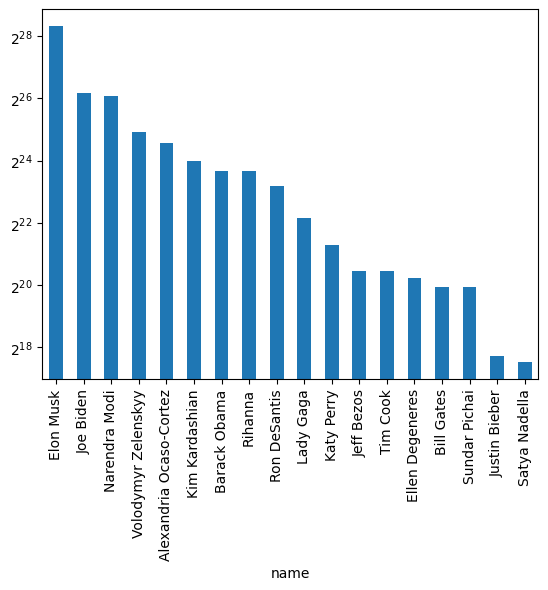

In [17]:


so.plot.bar()
plt.yscale('log',base=2) 

plt.show()
#Number of Likes by Celebrity

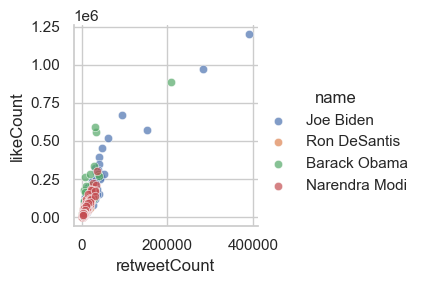

(0.0, 20000.0)

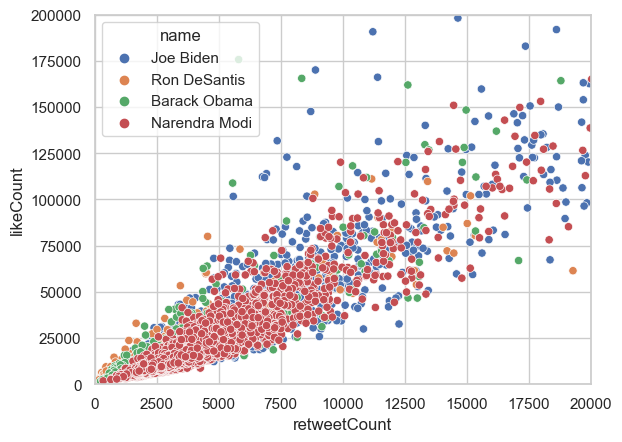

In [118]:
s_pol = tweets_df.query('name == "Joe Biden" or  name == "Barack Obama" or name == "Ron DeSantis" or name == "Alexandra Ocaso-Cortez" or name == "Narendra Modi"')
s_pol.shape
sns.set(style='whitegrid')

 
sns.scatterplot(x="retweetCount",
                    y="likeCount",
                    hue="name",
                    data=s_pol)
plt.ylim(0, 200000)
plt.xlim(0, 20000)

(0.0, 1000.0)

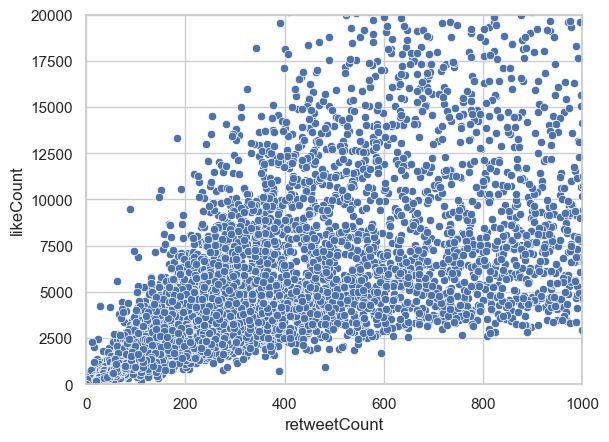

In [18]:

sns.set(style='whitegrid')
 
sns.scatterplot(x="retweetCount",
                    y="likeCount",
                    data=tweets_df)
plt.ylim(0, 20000)
plt.xlim(0, 1000)

In [19]:
pd.options.display.max_colwidth = 200
#print(tweets_df['mentionedUsers'])
pd.set_option('display.max_rows', tweets_df.shape[0]+1)
#print(tweets_df['hashtags'])

In [ ]:
for row in tweets_df["content"]:
    print(row)

In [20]:

#stop_words = set(stopwords.words('english'))

#stopwords = stopwords.words('english')+[" ", "based", "regarding", "good", "right", "even", ""]
#print(stop_words)

In [30]:

rslt_df = tweets_df[tweets_df['name'] == "Elon Musk"]
rslt_df.shape

(4103, 16)

In [29]:
print(celebs)

['Elon Musk', 'Sundar Pichai', 'Tim Cook', 'Jeff Bezos', 'Satya Nadella', 'Bill Gates', 'Volodymyr Zelenskyy', 'Joe Biden', 'Alexandria Ocaso-Cortez', 'Ron DeSantis', 'Barack Obama', 'Narendra Modi', 'Kim Kardashian', 'Rihanna', 'Justin Bieber', 'Katy Perry', 'Lady Gaga', 'Ellen Degeneres']


In [144]:

c=str(celebs[i]).lower()
c=c.replace(" ", "")
c=c+".pickle"
print(c)

ellendegeneres.pickle


In [127]:
print(type(wordcloud))


<class 'wordcloud.wordcloud.WordCloud'>


In [150]:
#original for loop

## #Setting stop words

stop_words = set(stopwords.words('english'))
stop_words = (list(stop_words)) + [" ", "based", "regarding", "good", "right", "even", "", "thank", "Thank", "https"]


#Setting stop words


for i in range(len(celebs)):
    #selecting the celbrity
    df = tweets_df[tweets_df['name'] == celebs[i]]
    #saving the Tweet-content in a string variable
    x = str(df["content"])
    token = word_tokenize(x)
    
    #using regex to only select alphanumeric
    l=[]
    for j in range(len(token)):
        l.append(re.sub(r'\W+', '', token[j]))
    
    #getting rid of stop words
    filtered = []
    for w in l:
        if w.lower() not in stop_words:
            filtered.append(w)
            
    #creating dic to count number of words       
    word_dic = {}
    for m in filtered:
        if m in word_dic:
            word_dic[m] +=1
        else:
            word_dic[m] = 1
    
    s = {k: v for k, v in sorted(word_dic.items(), key=lambda item: item[1], reverse=True)}
    
    #Wordcloud
    comment_words = ''
    stop_words2 = list(STOPWORDS)

    #putting list back into a string
    token_2 = (" ".join(s))

    wordcloud = WordCloud(width = 800, height = 800,       
        background_color ='white',
        stopwords = stop_words2,
        max_words = 100,
        min_word_length = 3,
        min_font_size = 10).generate(token_2)
        

    fig2 =plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.title(celebs[i] + ' Tweetcloud')
    #print(celebs[i])
    #plt.savefig("images/" + celebs[i].replace(" ", "") +'foo.png')
    
   
    
    
    #plt.show()
    #ax = pickle.load(file('c'))
    #plt.show()
    #st.pyplot(fig2)
            
     

         



AttributeError: 'str' object has no attribute 'close'

In [151]:
print(celebs)

['Elon Musk', 'Sundar Pichai', 'Tim Cook', 'Jeff Bezos', 'Satya Nadella', 'Bill Gates', 'Volodymyr Zelenskyy', 'Joe Biden', 'Alexandria Ocaso-Cortez', 'Ron DeSantis', 'Barack Obama', 'Narendra Modi', 'Kim Kardashian', 'Rihanna', 'Justin Bieber', 'Katy Perry', 'Lady Gaga', 'Ellen Degeneres']


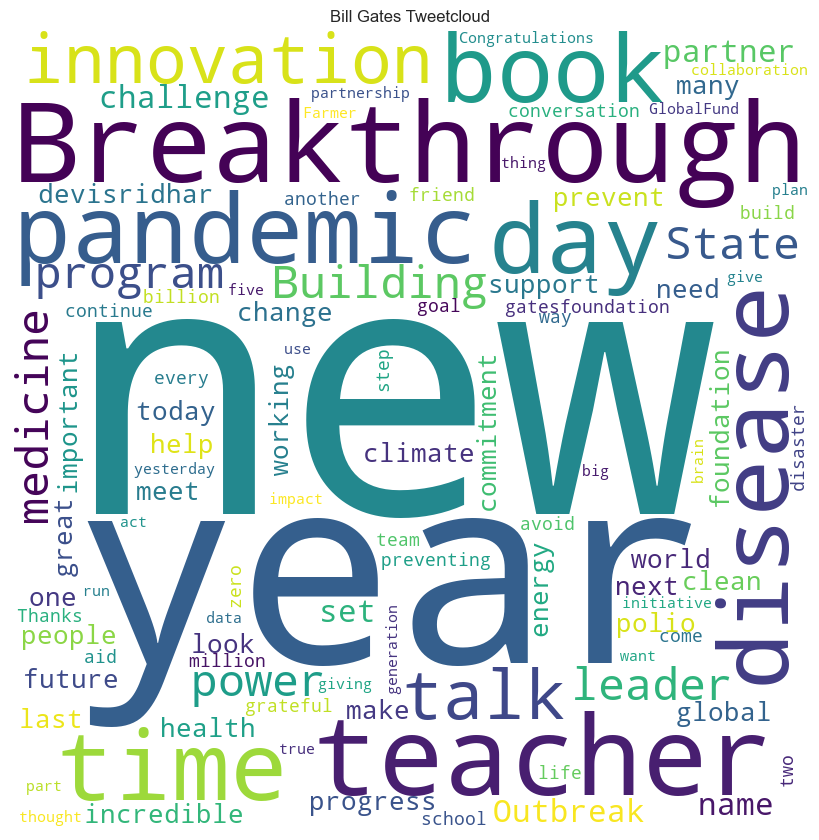

In [158]:
#streamlit version

#if celeb= 
stop_words = set(stopwords.words('english'))
stop_words = (list(stop_words)) + [" ", "based", "regarding", "good", "right", "even", "", "thank", "Thank", "https"]

wordcloud_dic = {}

#Setting stop words


for i in range(len(celebs)):
    #selecting the celbrity
    
    df = tweets_df[tweets_df['name'] == celebs[i]]
    #saving the Tweet-content in a string variable
    x = str(df["content"])
    token = word_tokenize(x)
    
    #using regex to only select alphanumeric
    l=[]
    for j in range(len(token)):
        l.append(re.sub(r'\W+', '', token[j]))
    
    #getting rid of stop words
    filtered = []
    for w in l:
        if w.lower() not in stop_words:
            filtered.append(w)
            
    #creating dic to count number of words       
    word_dic = {}
    for m in filtered:
        if m in word_dic:
            word_dic[m] +=1
        else:
            word_dic[m] = 1
    
    s = {k: v for k, v in sorted(word_dic.items(), key=lambda item: item[1], reverse=True)}
    
    #Wordcloud
    comment_words = ''
    stop_words2 = list(STOPWORDS)

    #putting list back into a string
    token_2 = (" ".join(s))

    wordcloud = WordCloud(width = 800, height = 800,       
        background_color ='white',
        stopwords = stop_words2,
        max_words = 100,
        min_word_length = 3,
        min_font_size = 10).generate(token_2)

    wordcloud_dic[celebs[i]] = wordcloud

#index=celebs.index(celeb)
        

fig2 =plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud_dic["Bill Gates"])
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Bill Gates" + ' Tweetcloud')
plt.show()
#print(celebs[i])
#plt.savefig("images/" + wordcloud_dic["Bill Gates"].replace(" ", "") +'foo.png')


    
   
    
    

    #ax = pickle.load(file('c'))
    #plt.show()
    #st.pyplot(fig2)
            
     

         

In [ ]:
c=str(celebs[i]).lower()
    c=c.replace(" ", "")
    c=c+".pickle"

In [269]:

#x = str(tweets_df["content"])  


#Step 1: tokenizing the string and appending it into a list
#token = word_tokenize(x)


SyntaxError: incomplete input (2779845545.py, line 9)

In [29]:
#Step 2: running a regex to keep only alphanumeric
l=[]
for i in range(len(token)):
    l.append(re.sub(r'\W+', '', token[i]))


In [30]:
print(l)

['0', '', 'EvaFoxU', '', 'Reuters', 'Exactly', '', 'The', 'obvious', 'reality', '', '1', 'Update', 'from', '', 'Neuralink', 'at', '6pm', 'PT', '2', '', 'NorthmanTrader', '', 'vincent13031925', 'Exactly', '3', '', 'vincent13031925', 'Trend', 'is', 'concerning', '', 'Fed', 'need', '', '4', '', 'teslaownersSV', 'Much', 'more', '', 'but', 'I', 'am', 'simply', 'stat', '', '', '15443', 'The', 'one', 'and', 'only', '', 'chefjoseandres', 'is', 'reopening', '', '15444', 'Jim', 'and', '', 'speaknowsasha', 'felt', 'like', 'it', 'was', 'the', 'pe', '', '15445', '', '', 'RuPaul', 'took', 'the', 'hot', 'seat', 'in', 'today', '', 's', '', 'Burning', '', '15446', '', '', 'RuPaul', 'is', 'on', 'the', 'show', 'today', '', 'https', '', 'tcoyX', '', '15447', 'You', '', 're', 'a', 'man', 'of', 'many', 'talents', '', 'DaxShepard', '', 'Here', '', 'Name', '', 'content', '', 'Length', '', '15448', '', 'dtype', '', 'object']


In [31]:


#putting list back into a string
#token_2 = (" ".join(l))

#getting the stop words list in english
stop_words = set(stopwords.words('english'))

#selecting only words that are not stop words
filtered = []
for w in l:
    if w.lower() not in stop_words:
        filtered.append(w)
print(filtered) 
#print(word_tokens)
#print(filtered_sentence)'''

['0', '', 'EvaFoxU', '', 'Reuters', 'Exactly', '', 'obvious', 'reality', '', '1', 'Update', '', 'Neuralink', '6pm', 'PT', '2', '', 'NorthmanTrader', '', 'vincent13031925', 'Exactly', '3', '', 'vincent13031925', 'Trend', 'concerning', '', 'Fed', 'need', '', '4', '', 'teslaownersSV', 'Much', '', 'simply', 'stat', '', '', '15443', 'one', '', 'chefjoseandres', 'reopening', '', '15444', 'Jim', '', 'speaknowsasha', 'felt', 'like', 'pe', '', '15445', '', '', 'RuPaul', 'took', 'hot', 'seat', 'today', '', '', 'Burning', '', '15446', '', '', 'RuPaul', 'show', 'today', '', 'https', '', 'tcoyX', '', '15447', '', 'man', 'many', 'talents', '', 'DaxShepard', '', '', 'Name', '', 'content', '', 'Length', '', '15448', '', 'dtype', '', 'object']


In [39]:
word_dic = {}
for i in filtered:
    if i in word_dic:
        word_dic[i] +=1
    else:
        word_dic[i] = 1



In [40]:
s = {k: v for k, v in sorted(word_dic.items(), key=lambda item: item[1], reverse=True)}
print(s)

{'': 3704, 'https': 791, 'Happy': 117, 'birthday': 81, 'show': 71, 'love': 57, 'one': 56, 'years': 34, 'first': 32, 'time': 31, 'today': 30, 'like': 30, 'back': 26, 'fun': 24, 'day': 24, 'always': 23, 'much': 23, 'favorite': 20, 'Season': 20, 'last': 20, 'know': 20, 'get': 19, 'loved': 19, 'HeadsUp': 19, 'final': 19, 'new': 19, 'incredible': 18, 'best': 18, 'way': 18, 'play': 18, 'friend': 18, 'many': 18, 'people': 18, 'make': 17, 'good': 17, 'got': 17, 'Ellen': 16, 'audience': 16, 'see': 16, 'going': 16, 'Thank': 16, 'kids': 15, 'lot': 15, 'game': 14, 'Day': 14, 'season': 14, 'amazing': 14, 'never': 14, 'better': 13, 'would': 13, 'life': 13, 'things': 13, 'hope': 12, 'think': 12, 'round': 12, 'video': 12, 'friends': 12, 'Official_tWitch': 12, 'story': 11, 'playing': 11, 'Today': 11, 'world': 11, 'guest': 11, 'episode': 11, 'family': 11, 'moments': 11, 'Jennifer': 11, 'told': 10, 'really': 10, 'days': 10, 'ever': 10, 'still': 10, 'guess': 10, 'coming': 10, 'played': 10, 'celebrate': 10

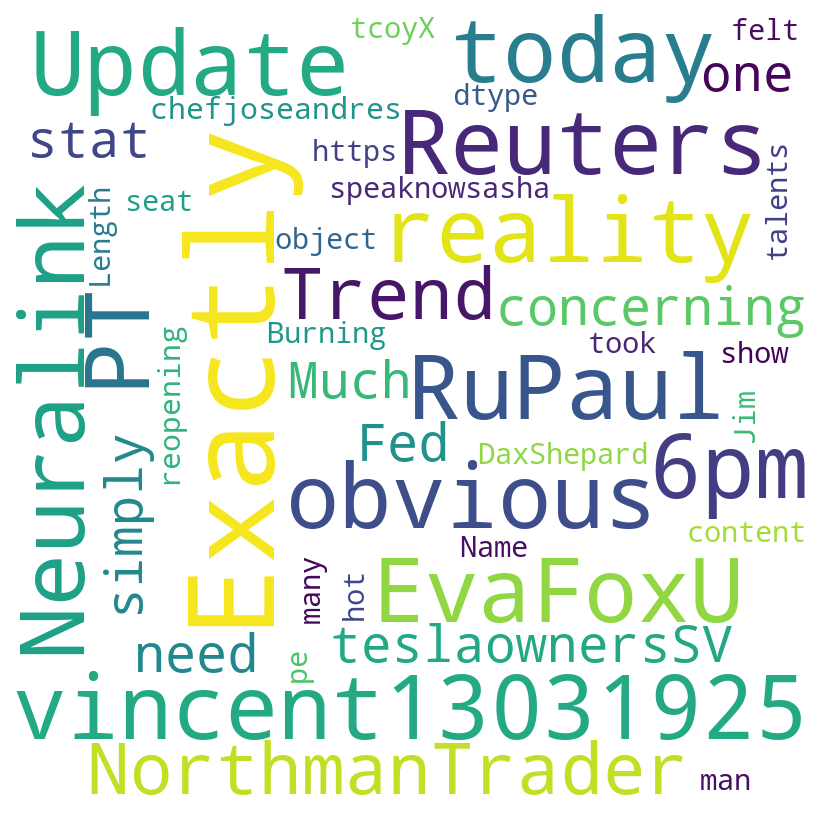

In [34]:
#Wordcloud
comment_words = ''
stopwords = set(STOPWORDS)

 

#putting list back into a string
token_2 = (" ".join(s))

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(token_2)
 


plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [73]:
tweets_df



,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972372021248,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'veri...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'ver...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869910253569,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'v...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, '...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111470252032,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stating the obvious","@teslaownersSV Much more, but I am simply stating the obvious",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'desc...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558073667584,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'disp

In [19]:
for i in tweets_df:
    print(tweets_df["likeCount"])

0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898

In [32]:
tweets_df

,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972...,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'us...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869...,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed need...,@vincent13031925 Trend is concerning. Fed need...,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'us...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111...,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stat...","@teslaownersSV Much more, but I am simply stat...",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'us...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558...,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bot...,@teslaownersSV We’re implementing anti-bot bot...,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'us...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
4,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597866295...,2022-11-30 08:13:06+00:00,Microservices …\n https://t.co/w6K0t1SRRs,Microservices …\n m.youtube.com/watch?v=y8Onox…,1597866295617167360,"{'_type': 'snscrape.modules.twitter.User', 'us...",1370,909,12213,...,None,NaN,None,1.597829e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",None,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4083,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477775713...,2022-01-02 22:56:00+00:00,https://t.co/LA9hPzVlGx,https://t.co/LA9hPzVlGx,1477775713172402176,"{'_type': 'snscrape.modules.twitter.User', 'us...",24588,48212,456147,...,"[{'_type': 'snscrape.modules.twitter.Photo', '...",NaN,None,NaN,None,None,NaN,NaN,None,NaN
4084,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477706142...,2022-01-02 18:19:33+00:00,Let’s make the roaring 20’s happen!,Let’s make the roaring 20’s happen!,1477706142461706248,"{'_type': 'snscrape.modules.twitter.User', 'us...",21460,25035,306891,...,None,NaN,None,NaN,None,None,NaN,NaN,None,NaN
4085,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477700424...,2022-01-02 17:56:50+00:00,Great work by Tesla team worldwide! https://t....,Great work by Tesla team worldwide! twitter.co...,1477700424933253123,"{'_type': 'snscrape.modules.twitter.User', 'us...",5449,4216,63962,...,None,NaN,"{'_type': 'snscrape.modules.twitter.Tweet', 'u...",NaN,None,None,NaN,NaN,None,NaN
4086,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477096955...,2022-01-01 01:58:52+00:00,@BLKMDL3 @Tesla 🔥,@BLKMDL3 @Tesla 🔥,1477096955658579974,"{'_type': 'snscrape.modules.twitter.User', 'us...",1026,444,42845,...,None,NaN,None,1.476958e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
